# **Cell 1 – Structure Scanner + Paths JSON**

In [1]:
import os
import json
from pathlib import Path
from datetime import datetime
import pandas as pd
from IPython.display import display

# ============================================================
# CONFIG
# ============================================================
ROOT = Path("/kaggle/input")
GROUP_NAME = "dr-grading-5class"

IMAGE_EXTS = {'.jpg', '.jpeg', '.png', '.bmp', '.tif', '.tiff', '.gif', '.webp'}
META_EXTS  = {'.csv', '.tsv', '.xlsx', '.xls', '.json', '.txt', '.xml'}

structure = {}
meta_files = []

def is_image(p: Path) -> bool:
    return p.suffix.lower() in IMAGE_EXTS

def walk(path: Path, current_dict: dict):
    print(f"Checking → {path}")
    
    try:
        entries = sorted(path.iterdir())
    except PermissionError:
        print(f"  ⚠️  Permission denied: {path}")
        return

    has_image = any(is_image(e) for e in entries if e.is_file())
    
    if has_image:
        current_dict["__contains_images__"] = True
        current_dict["__subdirs__"] = [e.name for e in entries if e.is_dir()]
        print(f"  → Contains images. Stopping deeper traversal.")
        return

    for entry in entries:
        if entry.is_dir():
            current_dict[entry.name] = {}
            walk(entry, current_dict[entry.name])
        elif entry.suffix.lower() in META_EXTS:
            meta_files.append(str(entry))
            current_dict.setdefault("__meta_files__", []).append(entry.name)
            print(f"  → Found metadata: {entry.name}")

# ============================================================
# RUN SCAN
# ============================================================
print(f"Scanning structure for group: {GROUP_NAME}\n")
walk(ROOT, structure)

# Save structure JSON
structure_path = f"/kaggle/working/{GROUP_NAME}_structure.json"
with open(structure_path, "w") as f:
    json.dump(structure, f, indent=2)
print(f"\n✅ Structure JSON saved → {structure_path}")

# ============================================================
# BUILD PATHS DB (we will fill this properly after seeing the scan)
# ============================================================
paths_db = {
    "group": GROUP_NAME,
    "created": datetime.now().isoformat(),
    "datasets": {}          # will be filled after we see the scan results
}

paths_path = f"/kaggle/working/{GROUP_NAME}_paths_db.json"
with open(paths_path, "w") as f:
    json.dump(paths_db, f, indent=2)
print(f"✅ Paths DB skeleton saved → {paths_path}")

# ============================================================
# SHOW METADATA FILES
# ============================================================
print("\n===== METADATA / CSV FILES FOUND =====")
if meta_files:
    df_meta = pd.DataFrame({
        "Metadata File": meta_files,
        "Parent Folder": [str(Path(p).parent) for p in meta_files]
    })
    display(df_meta)
else:
    print("No CSV / metadata files found.")

print("\nDone. Paste the important parts of the scan here so I can build the full paths_db.")

Scanning structure for group: dr-grading-5class

Checking → /kaggle/input
Checking → /kaggle/input/datasets
Checking → /kaggle/input/datasets/abdhendi
Checking → /kaggle/input/datasets/abdhendi/messifor2
  → Found metadata: messidor-2.csv
Checking → /kaggle/input/datasets/abdhendi/messifor2/messidor2
Checking → /kaggle/input/datasets/abdhendi/messifor2/messidor2/IMAGES
  → Contains images. Stopping deeper traversal.
Checking → /kaggle/input/datasets/dankok
Checking → /kaggle/input/datasets/dankok/diabetic-retinopathy-image-dataset
Checking → /kaggle/input/datasets/dankok/diabetic-retinopathy-image-dataset/Disease_Grading
Checking → /kaggle/input/datasets/dankok/diabetic-retinopathy-image-dataset/Disease_Grading/Groundtruths
  → Found metadata: IDRiD_Disease Grading_Testing Labels.csv
  → Found metadata: IDRiD_Disease Grading_Training Labels.csv
Checking → /kaggle/input/datasets/dankok/diabetic-retinopathy-image-dataset/Disease_Grading/Original_Images
Checking → /kaggle/input/datasets/d

,Metadata File,Parent Folder
0,/kaggle/input/datasets/abdhendi/messifor2/mess...,/kaggle/input/datasets/abdhendi/messifor2
1,/kaggle/input/datasets/dankok/diabetic-retinop...,/kaggle/input/datasets/dankok/diabetic-retinop...
2,/kaggle/input/datasets/dankok/diabetic-retinop...,/kaggle/input/datasets/dankok/diabetic-retinop...
3,/kaggle/input/datasets/dankok/diabetic-retinop...,/kaggle/input/datasets/dankok/diabetic-retinop...
4,/kaggle/input/datasets/dankok/diabetic-retinop...,/kaggle/input/datasets/dankok/diabetic-retinop...
5,/kaggle/input/datasets/dankok/diabetic-retinop...,/kaggle/input/datasets/dankok/diabetic-retinop...
6,/kaggle/input/datasets/dankok/diabetic-retinop...,/kaggle/input/datasets/dankok/diabetic-retinop...
7,/kaggle/input/datasets/hamza202404/drdm1-six-f...,/kaggle/input/datasets/hamza202404/drdm1-six-f...
8,/kaggle/input/datasets/hamza202404/drdm1-six-f...,/kaggle/input/datasets/hamza202404/drdm1-six-f...
9,/kaggle/input/datasets/hamza202404/drdm1-six-f...,/kaggle/input/datasets/hamza202404/drdm1-six-f...



Done. Paste the important parts of the scan here so I can build the full paths_db.


# **Updated Paths DB**

In [2]:
import json
from datetime import datetime
from pathlib import Path

paths_db = {
    "group": "dr-grading-5class",
    "created": datetime.now().isoformat(),
    "datasets": {
        "IDRiD (mohamedabdalkader)": {
            "kaggle_slug": "mohamedabdalkader/indian-diabetic-retinopathy-image-dataset-idrid",
            "root": "/kaggle/input/datasets/mohamedabdalkader/indian-diabetic-retinopathy-image-dataset-idrid/IDRiD",
            "train_images": "/kaggle/input/datasets/mohamedabdalkader/indian-diabetic-retinopathy-image-dataset-idrid/IDRiD/Train/images",
            "test_images": "/kaggle/input/datasets/mohamedabdalkader/indian-diabetic-retinopathy-image-dataset-idrid/IDRiD/Test/images",
            "train_csv": "/kaggle/input/datasets/mohamedabdalkader/indian-diabetic-retinopathy-image-dataset-idrid/IDRiD/Train/annotations.csv",
            "test_csv": "/kaggle/input/datasets/mohamedabdalkader/indian-diabetic-retinopathy-image-dataset-idrid/IDRiD/Test/annotations.csv",
            "type": "csv_based",
            "notes": "Classic IDRiD Disease Grading"
        },
        "IDRiD2 (mohamedabdalkader)": {
            "kaggle_slug": "mohamedabdalkader/indian-diabetic-retinopathy-image-dataset-idrid2",
            "root": "/kaggle/input/datasets/mohamedabdalkader/indian-diabetic-retinopathy-image-dataset-idrid2/IDRiD",
            "train_images": "/kaggle/input/datasets/mohamedabdalkader/indian-diabetic-retinopathy-image-dataset-idrid2/IDRiD/train/images",
            "test_images": "/kaggle/input/datasets/mohamedabdalkader/indian-diabetic-retinopathy-image-dataset-idrid2/IDRiD/test/images",
            "train_csv": "/kaggle/input/datasets/mohamedabdalkader/indian-diabetic-retinopathy-image-dataset-idrid2/IDRiD/train/annotations.csv",
            "test_csv": "/kaggle/input/datasets/mohamedabdalkader/indian-diabetic-retinopathy-image-dataset-idrid2/IDRiD/test/annotations.csv",
            "type": "csv_based",
            "notes": "Extended / captioned version of IDRiD"
        },
        "Diabetic Retinopathy Image Dataset (dankok)": {
            "kaggle_slug": "dankok/diabetic-retinopathy-image-dataset",
            "root": "/kaggle/input/datasets/dankok/diabetic-retinopathy-image-dataset",
            "images_train": "/kaggle/input/datasets/dankok/diabetic-retinopathy-image-dataset/Disease_Grading/Original_Images/Training Set",
            "images_test": "/kaggle/input/datasets/dankok/diabetic-retinopathy-image-dataset/Disease_Grading/Original_Images/Testing Set",
            "csv_train": "/kaggle/input/datasets/dankok/diabetic-retinopathy-image-dataset/Disease_Grading/Groundtruths/IDRiD_Disease Grading_Training Labels.csv",
            "csv_test": "/kaggle/input/datasets/dankok/diabetic-retinopathy-image-dataset/Disease_Grading/Groundtruths/IDRiD_Disease Grading_Testing Labels.csv",
            "type": "csv_based",
            "notes": "This is actually IDRiD Disease Grading part"
        },
        "Messidor-2 (abdhendi)": {
            "kaggle_slug": "abdhendi/messifor2",
            "root": "/kaggle/input/datasets/abdhendi/messifor2",
            "images": "/kaggle/input/datasets/abdhendi/messifor2/messidor2/IMAGES",
            "csv": "/kaggle/input/datasets/abdhendi/messifor2/messidor-2.csv",
            "type": "csv_based",
            "notes": "Messidor-2"
        },
        "Multi DR Collection (hamza202404)": {
            "kaggle_slug": "hamza202404/drdm1-six-fundus-images-datasets-by-mian-hamza",
            "root": "/kaggle/input/datasets/hamza202404/drdm1-six-fundus-images-datasets-by-mian-hamza",
            "datasets_inside": ["Aptos", "DDR", "DeepDRiD", "EyePac", "IDRID", "Messidor", "DRDM1"],
            "type": "multi",
            "notes": "Contains several classic DR datasets + CSVs"
        }
    }
}

with open("/kaggle/working/dr-grading-5class_paths_db.json", "w") as f:
    json.dump(paths_db, f, indent=2)

print("✅ paths_db updated and saved")
print(json.dumps(paths_db, indent=2))

✅ paths_db updated and saved
{
  "group": "dr-grading-5class",
  "created": "2026-09-23T11:21:55.779342",
  "datasets": {
    "IDRiD (mohamedabdalkader)": {
      "kaggle_slug": "mohamedabdalkader/indian-diabetic-retinopathy-image-dataset-idrid",
      "root": "/kaggle/input/datasets/mohamedabdalkader/indian-diabetic-retinopathy-image-dataset-idrid/IDRiD",
      "train_images": "/kaggle/input/datasets/mohamedabdalkader/indian-diabetic-retinopathy-image-dataset-idrid/IDRiD/Train/images",
      "test_images": "/kaggle/input/datasets/mohamedabdalkader/indian-diabetic-retinopathy-image-dataset-idrid/IDRiD/Test/images",
      "train_csv": "/kaggle/input/datasets/mohamedabdalkader/indian-diabetic-retinopathy-image-dataset-idrid/IDRiD/Train/annotations.csv",
      "test_csv": "/kaggle/input/datasets/mohamedabdalkader/indian-diabetic-retinopathy-image-dataset-idrid/IDRiD/Test/annotations.csv",
      "type": "csv_based",
      "notes": "Classic IDRiD Disease Grading"
    },
    "IDRiD2 (mohamed

# **Cell 2 – Master Function For Analysis**

In [3]:
import os
import cv2
import numpy as np
import pandas as pd
from pathlib import Path
from collections import defaultdict, Counter
import matplotlib.pyplot as plt
from IPython.display import display, HTML
import warnings
warnings.filterwarnings("ignore")

# ============================================================
# MASTER ANALYSIS FUNCTION
# ============================================================
def analyze_dataset(dataset_name: str, root_path: str, class_folders: list = None, 
                    csv_path: str = None, label_col: str = None, image_col: str = None,
                    max_samples_per_class: int = 3):
    """
    Universal analyzer for fundus datasets in the 8-class group.
    
    Parameters:
    -----------
    dataset_name      : Nice display name
    root_path         : Path that contains the class folders OR the images folder
    class_folders     : List of class folder names (if folder-based). Leave None if CSV-based.
    csv_path          : Path to CSV (if label is in CSV)
    label_col         : Column name for class/label in CSV
    image_col         : Column name for image filename in CSV
    max_samples_per_class : How many sample images to show per class
    """
    
    print("="*80)
    print(f"DATASET: {dataset_name}")
    print("="*80)
    
    root = Path(root_path)
    image_exts = {'.jpg', '.jpeg', '.png', '.bmp', '.tif', '.tiff'}
    
    # --------------------------------------------------------
    # 1. Collect images + labels
    # --------------------------------------------------------
    data = []          # list of (class_name, full_path)
    
    if csv_path is not None:
        # CSV-based dataset
        df = pd.read_csv(csv_path)
        print(f"CSV loaded: {csv_path}  |  shape = {df.shape}")
        print("Columns:", df.columns.tolist())
        
        if label_col is None or image_col is None:
            print("⚠️  Please provide label_col and image_col")
            return
        
        for _, row in df.iterrows():
            img_name = str(row[image_col])
            label = str(row[label_col])
            # try to find the image
            possible = list(root.rglob(img_name))
            if possible:
                data.append((label, possible[0]))
            else:
                # sometimes only filename without extension or different location
                possible = list(root.rglob(f"*{Path(img_name).stem}*"))
                if possible:
                    data.append((label, possible[0]))
    else:
        # Folder-based dataset
        if class_folders is None:
            # auto-detect class folders (immediate subdirs that contain images)
            class_folders = []
            for p in root.iterdir():
                if p.is_dir():
                    has_img = any(f.suffix.lower() in image_exts for f in p.rglob("*") if f.is_file())
                    if has_img:
                        class_folders.append(p.name)
        
        print(f"Class folders found: {class_folders}")
        
        for cls in class_folders:
            cls_path = root / cls
            if not cls_path.exists():
                # try recursive search
                matches = list(root.rglob(cls))
                if matches:
                    cls_path = matches[0]
                else:
                    print(f"⚠️  Class folder not found: {cls}")
                    continue
            
            for img_path in cls_path.rglob("*"):
                if img_path.suffix.lower() in image_exts:
                    data.append((cls, img_path))
    
    if len(data) == 0:
        print("❌ No images found. Check the path.")
        return
    
    # --------------------------------------------------------
    # 2. Build summary table
    # --------------------------------------------------------
    class_counts = Counter([d[0] for d in data])
    total_images = sum(class_counts.values())
    
    # Resolution & size statistics
    res_per_class = defaultdict(set)
    size_per_class = defaultdict(list)
    
    print("\nCollecting resolution & size info (this may take a moment)...")
    for cls, path in data:
        try:
            img = cv2.imread(str(path))
            if img is None:
                continue
            h, w = img.shape[:2]
            res_per_class[cls].add(f"{w}x{h}")
            size_mb = path.stat().st_size / (1024 * 1024)
            size_per_class[cls].append(size_mb)
        except Exception as e:
            pass
    
    rows = []
    for cls in sorted(class_counts.keys()):
        count = class_counts[cls]
        pct = count / total_images * 100
        resolutions = ", ".join(sorted(res_per_class[cls])) if res_per_class[cls] else "N/A"
        avg_size = np.mean(size_per_class[cls]) if size_per_class[cls] else 0
        rows.append({
            "Class": cls,
            "Image Count": count,
            "Percentage": f"{pct:.1f}%",
            "Resolution(s)": resolutions,
            "Avg Size (MB)": f"{avg_size:.3f}"
        })
    
    # Total row
    all_sizes = [s for sizes in size_per_class.values() for s in sizes]
    rows.append({
        "Class": "TOTAL",
        "Image Count": total_images,
        "Percentage": "100%",
        "Resolution(s)": "-",
        "Avg Size (MB)": f"{np.mean(all_sizes):.3f}" if all_sizes else "0"
    })
    
    df_summary = pd.DataFrame(rows)
    print("\n----- SUMMARY TABLE -----")
    display(df_summary)
    
    # --------------------------------------------------------
    # 3. Per-class sample images
    # --------------------------------------------------------
    print("\n----- SAMPLE IMAGES PER CLASS -----")
    
    classes = sorted(class_counts.keys())
    n_classes = len(classes)
    
    # Limit samples
    samples = defaultdict(list)
    for cls, path in data:
        if len(samples[cls]) < max_samples_per_class:
            samples[cls].append(path)
    
    # Plot
    cols = min(max_samples_per_class, 3)
    rows_plot = n_classes
    
    fig, axes = plt.subplots(rows_plot, cols, figsize=(4*cols, 3.5*rows_plot))
    if rows_plot == 1:
        axes = np.array([axes])
    if cols == 1:
        axes = axes.reshape(-1, 1)
    
    for i, cls in enumerate(classes):
        for j in range(cols):
            ax = axes[i, j]
            if j < len(samples[cls]):
                img = cv2.imread(str(samples[cls][j]))
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                ax.imshow(img)
                ax.set_title(f"{cls}", fontsize=10)
            ax.axis("off")
    
    plt.suptitle(f"{dataset_name} – Sample Images", fontsize=14, y=1.01)
    plt.tight_layout()
    plt.show()
    
    # --------------------------------------------------------
    # 4. Statistical analysis
    # --------------------------------------------------------
    print("\n----- IMAGE STATISTICAL ANALYSIS -----")
    
    all_widths, all_heights, all_sizes_mb = [], [], []
    channels = []
    
    for cls, path in data[:min(500, len(data))]:   # sample up to 500 for speed
        try:
            img = cv2.imread(str(path))
            if img is None:
                continue
            h, w = img.shape[:2]
            all_widths.append(w)
            all_heights.append(h)
            all_sizes_mb.append(path.stat().st_size / (1024*1024))
            channels.append(img.shape[2] if len(img.shape) == 3 else 1)
        except:
            pass
    
    stats = {
        "Total Images Analyzed": len(all_widths),
        "Unique Resolutions": len(set(zip(all_widths, all_heights))),
        "Width  – min / mean / max": f"{min(all_widths)} / {np.mean(all_widths):.0f} / {max(all_widths)}",
        "Height – min / mean / max": f"{min(all_heights)} / {np.mean(all_heights):.0f} / {max(all_heights)}",
        "File Size (MB) – min / mean / max": f"{min(all_sizes_mb):.3f} / {np.mean(all_sizes_mb):.3f} / {max(all_sizes_mb):.3f}",
        "Channels (most common)": Counter(channels).most_common(1)[0][0] if channels else "N/A"
    }
    
    for k, v in stats.items():
        print(f"{k:35s} : {v}")
    
    print("\n" + "="*80 + "\n")

# **Part 3 – Individual Calls**

DATASET: IDRiD (Train)
CSV loaded: /kaggle/input/datasets/mohamedabdalkader/indian-diabetic-retinopathy-image-dataset-idrid/IDRiD/Train/annotations.csv  |  shape = (1239, 5)
Columns: ['Image name', 'Retinopathy grade', 'Risk of macular edema', 'class', 'caption']


----- SUMMARY TABLE -----


,Class,Image Count,Percentage,Resolution(s),Avg Size (MB)
0,0,402,32.4%,"4288x2848, 4880x3862",0.713
1,1,60,4.8%,"4288x2848, 4880x3862",0.719
2,2,408,32.9%,"4288x2848, 4880x3862",0.674
3,3,222,17.9%,"4288x2848, 4880x3862",0.690
4,4,147,11.9%,"4288x2848, 4880x3862",0.673
5,TOTAL,1239,100%,-,0.692



----- SAMPLE IMAGES PER CLASS -----


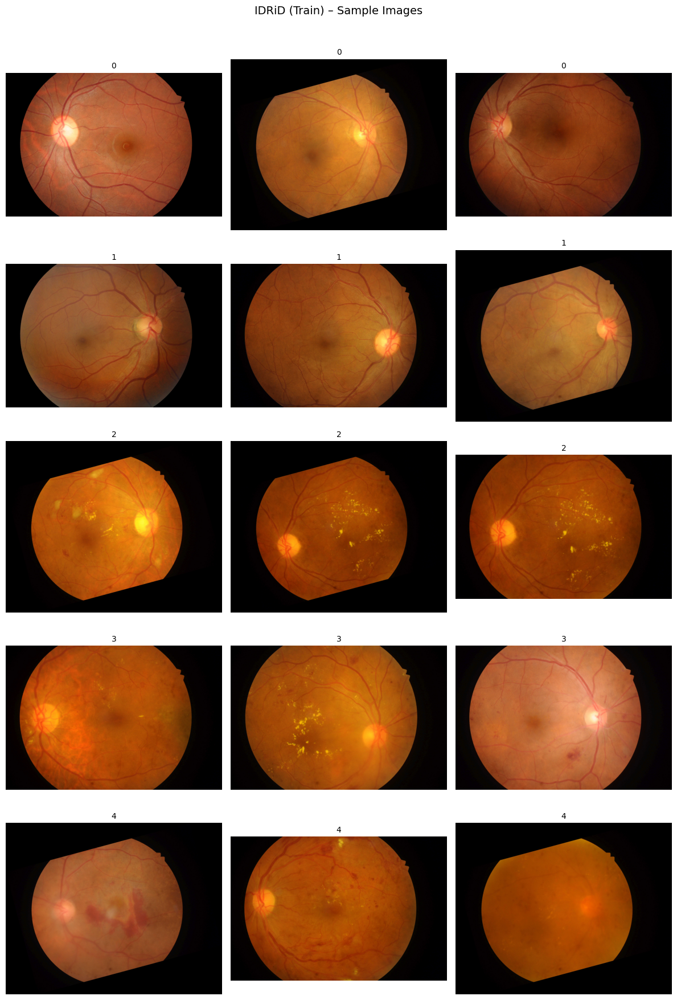


----- IMAGE STATISTICAL ANALYSIS -----
Total Images Analyzed               : 500
Unique Resolutions                  : 2
Width  – min / mean / max           : 4288 / 4667 / 4880
Height – min / mean / max           : 2848 / 3497 / 3862
File Size (MB) – min / mean / max   : 0.239 / 0.679 / 0.985
Channels (most common)              : 3




In [4]:
# 1. IDRiD (original)
analyze_dataset(
    dataset_name = "IDRiD (Train)",
    root_path    = "/kaggle/input/datasets/mohamedabdalkader/indian-diabetic-retinopathy-image-dataset-idrid/IDRiD/Train/images",
    csv_path     = "/kaggle/input/datasets/mohamedabdalkader/indian-diabetic-retinopathy-image-dataset-idrid/IDRiD/Train/annotations.csv",
    label_col    = "Retinopathy grade",   # will confirm after loading
    image_col    = "Image name"           # will confirm after loading
)

DATASET: IDRiD2 (Train)
CSV loaded: /kaggle/input/datasets/mohamedabdalkader/indian-diabetic-retinopathy-image-dataset-idrid2/IDRiD/train/annotations.csv  |  shape = (3304, 5)
Columns: ['Image name', 'Retinopathy grade', 'Risk of macular edema', 'class', 'Captions']


----- SUMMARY TABLE -----


,Class,Image Count,Percentage,Resolution(s),Avg Size (MB)
0,0,1072,32.4%,"4288x2848, 4564x3282, 4644x3418, 4850x3802, 49...",0.821
1,1,160,4.8%,"4288x2848, 4564x3282, 4644x3418, 4850x3802, 49...",0.841
2,2,1088,32.9%,"4288x2848, 4564x3282, 4644x3418, 4850x3802, 49...",0.778
3,3,592,17.9%,"4288x2848, 4564x3282, 4644x3418, 4850x3802, 49...",0.798
4,4,392,11.9%,"4288x2848, 4564x3282, 4644x3418, 4850x3802, 49...",0.782
5,TOTAL,3304,100%,-,0.799



----- SAMPLE IMAGES PER CLASS -----


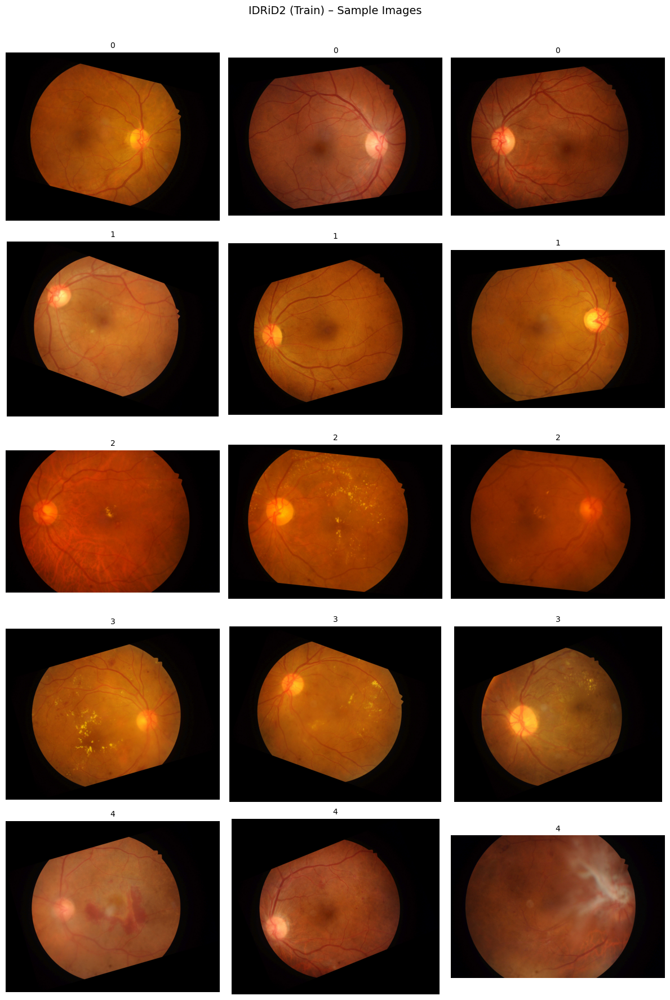


----- IMAGE STATISTICAL ANALYSIS -----
Total Images Analyzed               : 500
Unique Resolutions                  : 7
Width  – min / mean / max           : 4288 / 4697 / 5044
Height – min / mean / max           : 2848 / 3557 / 4248
File Size (MB) – min / mean / max   : 0.256 / 0.762 / 1.006
Channels (most common)              : 3




In [5]:
# 2. IDRiD2
analyze_dataset(
    dataset_name = "IDRiD2 (Train)",
    root_path    = "/kaggle/input/datasets/mohamedabdalkader/indian-diabetic-retinopathy-image-dataset-idrid2/IDRiD/train/images",
    csv_path     = "/kaggle/input/datasets/mohamedabdalkader/indian-diabetic-retinopathy-image-dataset-idrid2/IDRiD/train/annotations.csv",
    label_col    = "Retinopathy grade",
    image_col    = "Image name"
)

DATASET: IDRiD Disease Grading (dankok - Train)
CSV loaded: /kaggle/input/datasets/dankok/diabetic-retinopathy-image-dataset/Disease_Grading/Groundtruths/IDRiD_Disease Grading_Training Labels.csv  |  shape = (413, 12)
Columns: ['Image name', 'Retinopathy grade', 'Risk of macular edema ', 'Unnamed: 3', 'Unnamed: 4', 'Unnamed: 5', 'Unnamed: 6', 'Unnamed: 7', 'Unnamed: 8', 'Unnamed: 9', 'Unnamed: 10', 'Unnamed: 11']


----- SUMMARY TABLE -----


,Class,Image Count,Percentage,Resolution(s),Avg Size (MB)
0,0,134,32.4%,4288x2848,0.407
1,1,20,4.8%,4288x2848,0.398
2,2,136,32.9%,4288x2848,0.371
3,3,74,17.9%,4288x2848,0.374
4,4,49,11.9%,4288x2848,0.361
5,TOTAL,413,100%,-,0.383



----- SAMPLE IMAGES PER CLASS -----


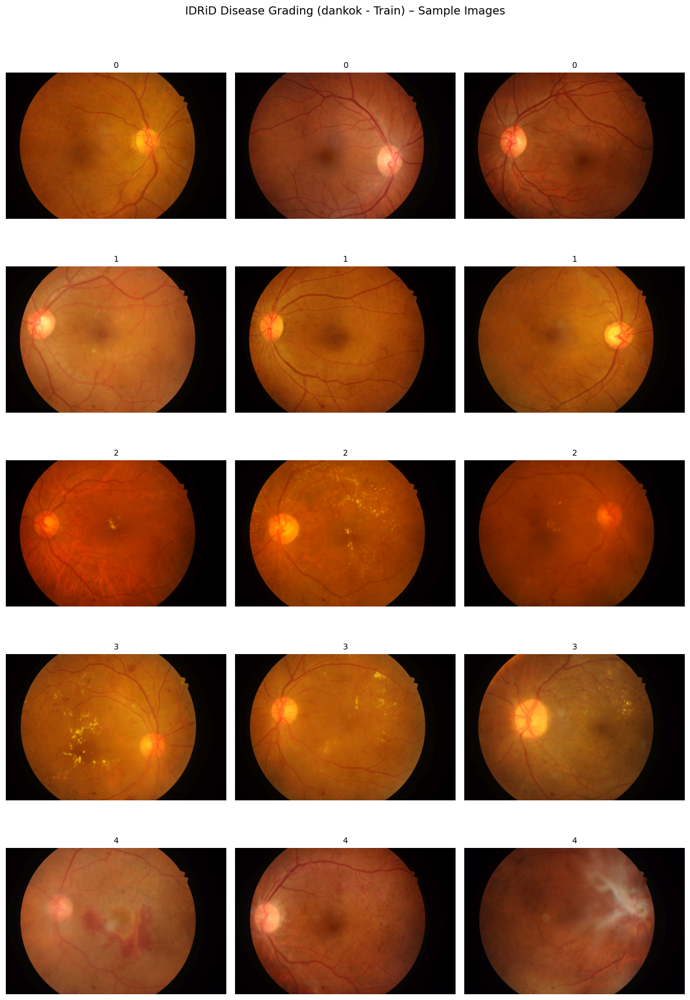


----- IMAGE STATISTICAL ANALYSIS -----
Total Images Analyzed               : 413
Unique Resolutions                  : 1
Width  – min / mean / max           : 4288 / 4288 / 4288
Height – min / mean / max           : 2848 / 2848 / 2848
File Size (MB) – min / mean / max   : 0.229 / 0.383 / 0.773
Channels (most common)              : 3




In [6]:
# 3. dankok (IDRiD Disease Grading)
analyze_dataset(
    dataset_name = "IDRiD Disease Grading (dankok - Train)",
    root_path    = "/kaggle/input/datasets/dankok/diabetic-retinopathy-image-dataset/Disease_Grading/Original_Images/Training Set",
    csv_path     = "/kaggle/input/datasets/dankok/diabetic-retinopathy-image-dataset/Disease_Grading/Groundtruths/IDRiD_Disease Grading_Training Labels.csv",
    label_col    = "Retinopathy grade",
    image_col    = "Image name"
)

DATASET: Messidor-2 (Google Brain grades)
CSV loaded: /kaggle/input/datasets/google-brain/messidor2-dr-grades/messidor_data.csv  |  shape = (1748, 4)
Columns: ['image_id', 'adjudicated_dr_grade', 'adjudicated_dme', 'adjudicated_gradable']


----- SUMMARY TABLE -----


,Class,Image Count,Percentage,Resolution(s),Avg Size (MB)
0,0.0,1017,58.2%,"1440x960, 2240x1488, 2304x1536",1.065
1,1.0,270,15.4%,"1440x960, 2240x1488, 2304x1536",1.502
2,2.0,347,19.9%,"1440x960, 2240x1488, 2304x1536",1.792
3,3.0,75,4.3%,"1440x960, 2240x1488, 2304x1536",2.371
4,4.0,35,2.0%,"2240x1488, 2304x1536",1.804
5,nan,4,0.2%,"1440x960, 2240x1488, 2304x1536",0.425
6,TOTAL,1748,100%,-,1.346



----- SAMPLE IMAGES PER CLASS -----


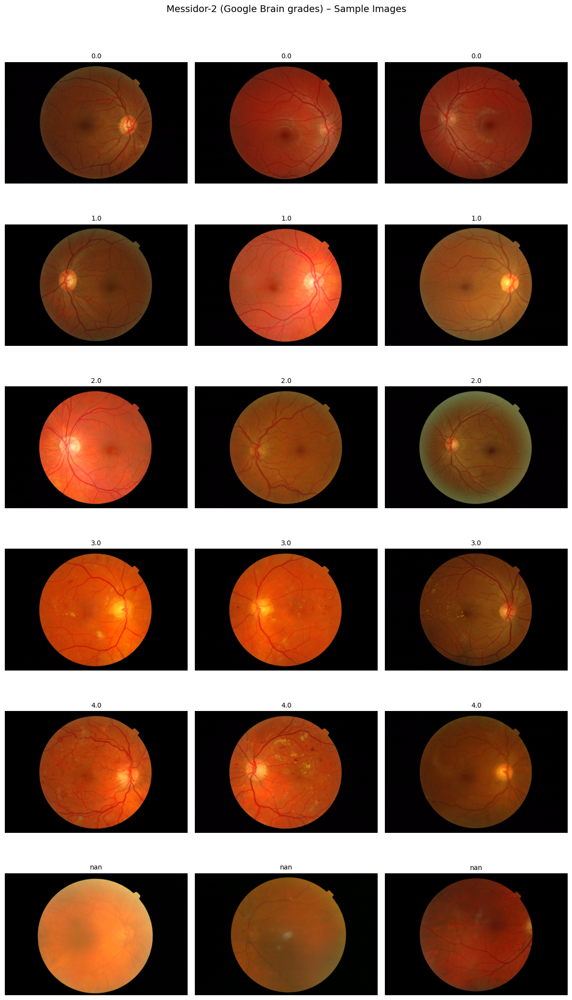


----- IMAGE STATISTICAL ANALYSIS -----
Total Images Analyzed               : 500
Unique Resolutions                  : 3
Width  – min / mean / max           : 1440 / 2017 / 2304
Height – min / mean / max           : 960 / 1343 / 1536
File Size (MB) – min / mean / max   : 0.915 / 2.391 / 3.749
Channels (most common)              : 3




In [11]:
# Messidor-2 with Google Brain grades
analyze_dataset(
    dataset_name = "Messidor-2 (Google Brain grades)",
    root_path    = "/kaggle/input/datasets/abdhendi/messifor2/messidor2/IMAGES",
    csv_path     = "/kaggle/input/datasets/google-brain/messidor2-dr-grades/messidor_data.csv",
    label_col    = "adjudicated_dr_grade",
    image_col    = "image_id"
)

DATASET: DeepDRiD (from hamza collection)
CSV loaded: /kaggle/input/datasets/hamza202404/drdm1-six-fundus-images-datasets-by-mian-hamza/DeepDRiD_dataset.csv  |  shape = (341, 3)
Columns: ['Image Name', 'Label (0-4)', 'types']


----- SUMMARY TABLE -----


,Class,Image Count,Percentage,Resolution(s),Avg Size (MB)
0,0,129,37.8%,"1734x1821, 1736x1824",0.447
1,1,54,15.8%,"1736x1824, 1976x1984, 2230x1725",0.569
2,2,75,22.0%,"1736x1824, 1976x1984",0.615
3,3,29,8.5%,"1736x1824, 1976x1984",0.519
4,4,54,15.8%,"1736x1824, 1976x1984",0.856
5,TOTAL,341,100%,-,0.574



----- SAMPLE IMAGES PER CLASS -----


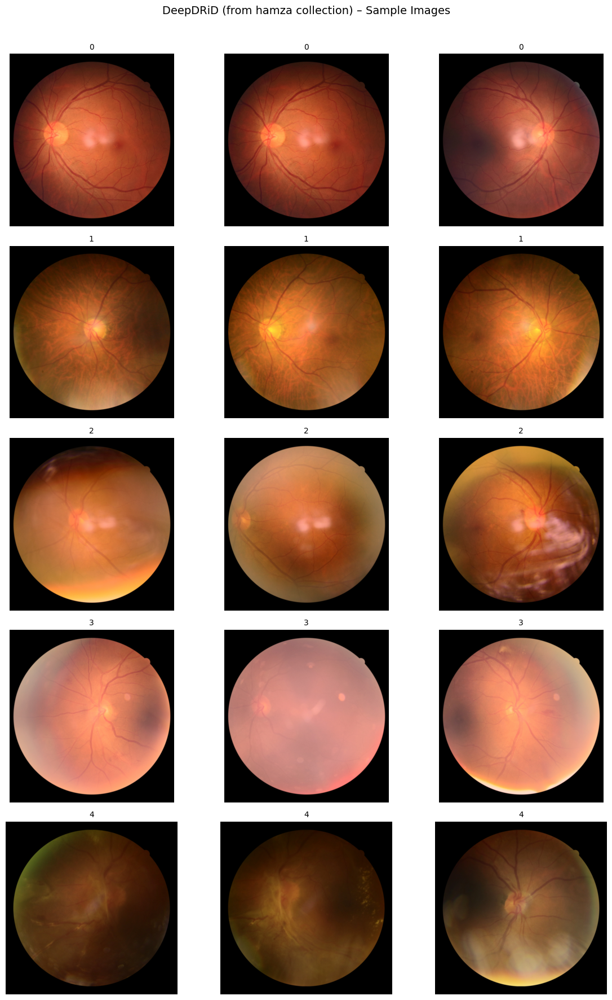


----- IMAGE STATISTICAL ANALYSIS -----
Total Images Analyzed               : 341
Unique Resolutions                  : 4
Width  – min / mean / max           : 1734 / 1823 / 2230
Height – min / mean / max           : 1725 / 1880 / 1984
File Size (MB) – min / mean / max   : 0.324 / 0.574 / 2.315
Channels (most common)              : 3




In [10]:
# 5. DeepDRiD (from hamza collection) - CORRECTED
analyze_dataset(
    dataset_name = "DeepDRiD (from hamza collection)",
    root_path    = "/kaggle/input/datasets/hamza202404/drdm1-six-fundus-images-datasets-by-mian-hamza/DeepDRiD/DeepDRiD",
    csv_path     = "/kaggle/input/datasets/hamza202404/drdm1-six-fundus-images-datasets-by-mian-hamza/DeepDRiD_dataset.csv",
    label_col    = "Label (0-4)",
    image_col    = "Image Name"
)

In [13]:
import json
import pandas as pd
from pathlib import Path
from datetime import datetime
from IPython.display import display

# ============================================================
# 1. PATHS DATABASE
# ============================================================
paths_db = {
    "group": "dr-grading-5class",
    "created": datetime.now().isoformat(),
    "datasets": {
        "IDRiD (mohamedabdalkader)": {
            "kaggle_slug": "mohamedabdalkader/indian-diabetic-retinopathy-image-dataset-idrid",
            "root": "/kaggle/input/datasets/mohamedabdalkader/indian-diabetic-retinopathy-image-dataset-idrid/IDRiD",
            "images_folder": "/kaggle/input/datasets/mohamedabdalkader/indian-diabetic-retinopathy-image-dataset-idrid/IDRiD/Train/images",
            "csv": "/kaggle/input/datasets/mohamedabdalkader/indian-diabetic-retinopathy-image-dataset-idrid/IDRiD/Train/annotations.csv",
            "type": "csv_based",
            "classes": ["0", "1", "2", "3", "4"]
        },
        "IDRiD2 (mohamedabdalkader)": {
            "kaggle_slug": "mohamedabdalkader/indian-diabetic-retinopathy-image-dataset-idrid2",
            "root": "/kaggle/input/datasets/mohamedabdalkader/indian-diabetic-retinopathy-image-dataset-idrid2/IDRiD",
            "images_folder": "/kaggle/input/datasets/mohamedabdalkader/indian-diabetic-retinopathy-image-dataset-idrid2/IDRiD/train/images",
            "csv": "/kaggle/input/datasets/mohamedabdalkader/indian-diabetic-retinopathy-image-dataset-idrid2/IDRiD/train/annotations.csv",
            "type": "csv_based",
            "classes": ["0", "1", "2", "3", "4"]
        },
        "IDRiD Disease Grading (dankok)": {
            "kaggle_slug": "dankok/diabetic-retinopathy-image-dataset",
            "root": "/kaggle/input/datasets/dankok/diabetic-retinopathy-image-dataset",
            "images_folder": "/kaggle/input/datasets/dankok/diabetic-retinopathy-image-dataset/Disease_Grading/Original_Images/Training Set",
            "csv": "/kaggle/input/datasets/dankok/diabetic-retinopathy-image-dataset/Disease_Grading/Groundtruths/IDRiD_Disease Grading_Training Labels.csv",
            "type": "csv_based",
            "classes": ["0", "1", "2", "3", "4"]
        },
        "Messidor-2 (Google Brain)": {
            "kaggle_slug": "abdhendi/messifor2 + google-brain/messidor2-dr-grades",
            "root": "/kaggle/input/datasets/abdhendi/messifor2",
            "images_folder": "/kaggle/input/datasets/abdhendi/messifor2/messidor2/IMAGES",
            "csv": "/kaggle/input/datasets/google-brain/messidor2-dr-grades/messidor_data.csv",
            "type": "csv_based",
            "classes": ["0", "1", "2", "3", "4"]
        },
        "DeepDRiD (hamza collection)": {
            "kaggle_slug": "hamza202404/drdm1-six-fundus-images-datasets-by-mian-hamza",
            "root": "/kaggle/input/datasets/hamza202404/drdm1-six-fundus-images-datasets-by-mian-hamza",
            "images_folder": "/kaggle/input/datasets/hamza202404/drdm1-six-fundus-images-datasets-by-mian-hamza/DeepDRiD/DeepDRiD",
            "csv": "/kaggle/input/datasets/hamza202404/drdm1-six-fundus-images-datasets-by-mian-hamza/DeepDRiD_dataset.csv",
            "type": "csv_based",
            "classes": ["0", "1", "2", "3", "4"]
        }
    }
}

# ============================================================
# 2. SUMMARY LOGS DB
# (Fill these in as you finish analyzing each dataset)
# ============================================================
summary_db = {
    "group": "dr-grading-5class",
    "created": datetime.now().isoformat(),
    "results": {
        # Example – replace with real numbers after you run analyze_dataset
        # "IDRiD (mohamedabdalkader)": {
        #     "total_images": 413,
        #     "classes": {"0": 134, "1": 20, "2": 136, "3": 74, "4": 49},
        #     "resolution": "4288x2848",
        #     "avg_size_mb": 1.2
        # },
    }
}

# ============================================================
# 3. MASTER TABLE + SIZE + TOTALS
# ============================================================
def get_folder_size_mb(folder_path: str) -> float:
    total = 0
    path = Path(folder_path)
    if not path.exists():
        return 0.0
    for f in path.rglob("*"):
        if f.is_file():
            total += f.stat().st_size
    return total / (1024 * 1024)

master_rows = []

for name, info in paths_db["datasets"].items():
    images_folder = info.get("images_folder") or info.get("root")
    size_mb = get_folder_size_mb(images_folder)
    result = summary_db["results"].get(name, {})
    
    master_rows.append({
        "Dataset": name,
        "Kaggle_Slug": info["kaggle_slug"],
        "Type": info["type"],
        "Num_Classes": len(info["classes"]),
        "Total_Images": result.get("total_images", 0),
        "Resolution": result.get("resolution", ""),
        "Avg_Size_MB": result.get("avg_size_mb", 0),
        "Total_Size_MB": round(size_mb, 1),
        "Total_Size_GB": round(size_mb / 1024, 2),
        "Classes": " | ".join(info["classes"]),
        "Per_Class_Counts": " | ".join(
            f"{cls}:{cnt}" for cls, cnt in result.get("classes", {}).items()
        ),
        "Root_Path": info["root"],
        "Images_Folder": images_folder,
        "CSV_Path": info.get("csv", ""),
        "Notes": result.get("notes", "")
    })

df_master = pd.DataFrame(master_rows)

# Grand Totals
total_images = df_master["Total_Images"].sum()
total_size_mb = df_master["Total_Size_MB"].sum()
total_size_gb = total_size_mb / 1024

print("=" * 80)
print("MASTER SUMMARY TABLE – dr-grading-5class")
print("=" * 80)
display(df_master[[
    "Dataset", "Num_Classes", "Total_Images", 
    "Total_Size_MB", "Total_Size_GB", "Resolution", "Avg_Size_MB"
]])

print("\n" + "=" * 80)
print("GRAND TOTALS")
print("=" * 80)
print(f"Total Datasets     : {len(df_master)}")
print(f"Total Images       : {total_images:,}")
print(f"Total Size         : {total_size_mb:,.1f} MB  ({total_size_gb:.2f} GB)")
print("=" * 80)

# Save
df_master.to_csv("/kaggle/working/dr-grading-5class_master_table.csv", index=False)
with open("/kaggle/working/dr-grading-5class_paths_db.json", "w") as f:
    json.dump(paths_db, f, indent=2)
with open("/kaggle/working/dr-grading-5class_summary_db.json", "w") as f:
    json.dump(summary_db, f, indent=2)

print("\n✅ Files saved:")
print(" - dr-grading-5class_paths_db.json")
print(" - dr-grading-5class_summary_db.json")
print(" - dr-grading-5class_master_table.csv")

MASTER SUMMARY TABLE – dr-grading-5class


,Dataset,Num_Classes,Total_Images,Total_Size_MB,Total_Size_GB,Resolution,Avg_Size_MB
0,IDRiD (mohamedabdalkader),5,0,856.8,0.84,,0
1,IDRiD2 (mohamedabdalkader),5,0,2488.8,2.43,,0
2,IDRiD Disease Grading (dankok),5,0,158.4,0.15,,0
3,Messidor-2 (Google Brain),5,0,2352.8,2.30,,0
4,DeepDRiD (hamza collection),5,0,195.8,0.19,,0



GRAND TOTALS
Total Datasets     : 5
Total Images       : 0
Total Size         : 6,052.6 MB  (5.91 GB)

✅ Files saved:
 - dr-grading-5class_paths_db.json
 - dr-grading-5class_summary_db.json
 - dr-grading-5class_master_table.csv
